# explore results (tbptt)

host = ```any```, device = ```cuda:1```

**Motivation**: <br>

Load from ```../tmp/results_2025-08```

In [1]:
# HIDE CODE


project_name = '_TemporalSC'


import os, sys
from IPython.display import display

# tmp & extras dir
git_dir = os.path.join(os.environ['HOME'], 'Dropbox/git')
extras_dir = os.path.join(git_dir, 'jb-progress-2025/_extras')
fig_base_dir = os.path.join(git_dir, 'jb-progress-2025/figs')
tmp_dir = os.path.join(git_dir, 'jb-progress-2025/tmp')

# GitHub
sys.path.insert(0, os.path.join(git_dir, project_name))
from figures.convergence import plot_convergence
from main.config_defaults import default_configs
from figures.fighelper import *
from main.train import *

# warnings, tqdm, & style
warnings.filterwarnings('ignore', category=DeprecationWarning)
warnings.filterwarnings('ignore', category=FutureWarning)
warnings.filterwarnings('ignore', category=UserWarning)
from rich.jupyter import print
%matplotlib inline
set_style()

In [2]:
device_idx = 1
device = f'cuda:{device_idx}'

print(f"device: {device}  ———  host: {os.uname().nodename}")

device: cuda:1  ———  host: chewie

## Results dir

In [3]:
results_dir = pjoin(tmp_dir, 'results_2025-08')
files_all = sorted(
    os.listdir(results_dir),
    key=alphanum_sort_key,
)
len(files_all)

109

In [4]:
cond = lambda f: 'vH16-wht' in f and ('tbptt' in f or '2025_08_19' in f)

files = [f for f in files_all if cond(f)]

len(files)

40

In [5]:
df = collections.defaultdict(list)

for f in tqdm(files):
    # load
    load = np.load(
        pjoin(results_dir, f),
        allow_pickle=True,
    ).item()

    # info
    items = ['kl_beta']  #, 'latent_channels']
    for item in items:
        df[item].append(load['info'][item])

    # temporary fix
    try:  # temporary solution
        t_tbptt = int_from_str(next(
            e for e in f.split('_')
            if 'tbptt' in e
        ))
    except StopIteration:
        t_tbptt = 1
    df['t_tbptt'].append(t_tbptt)

    # results
    items = ['r2', '%-zeros', 'euc_dist', 'n_active']
    for item in items:
        df[item].append(load['results'][item][-1])

df = pd.DataFrame(df)

100%|███████████████████████████████████████████| 40/40 [00:01<00:00, 32.59it/s]


In [6]:
cube = get_cubehelix_palette(
    n_colors=len(df['kl_beta'].unique()),
    start=2.5,
    rot=1.5,
    light=0.75,
    dark=0.25,
)
cube

[[0.706225801230003, 0.7467432467910528, 0.913590665210946],
 [0.5288256546728698, 0.7330965085236962, 0.7932422718507651],
 [0.4171933503202226, 0.7059984202453607, 0.601325971553649],
 [0.3948665128530643, 0.6360424765505592, 0.3957240447023259],
 [0.4448937894590833, 0.5123630078008597, 0.24529662618784487],
 [0.4966712949178098, 0.3737755635282003, 0.20570803867444043],
 [0.48774460191485725, 0.25155700124815017, 0.24387948810554363],
 [0.39386823956352857, 0.17055020705355356, 0.29268615464332437]]

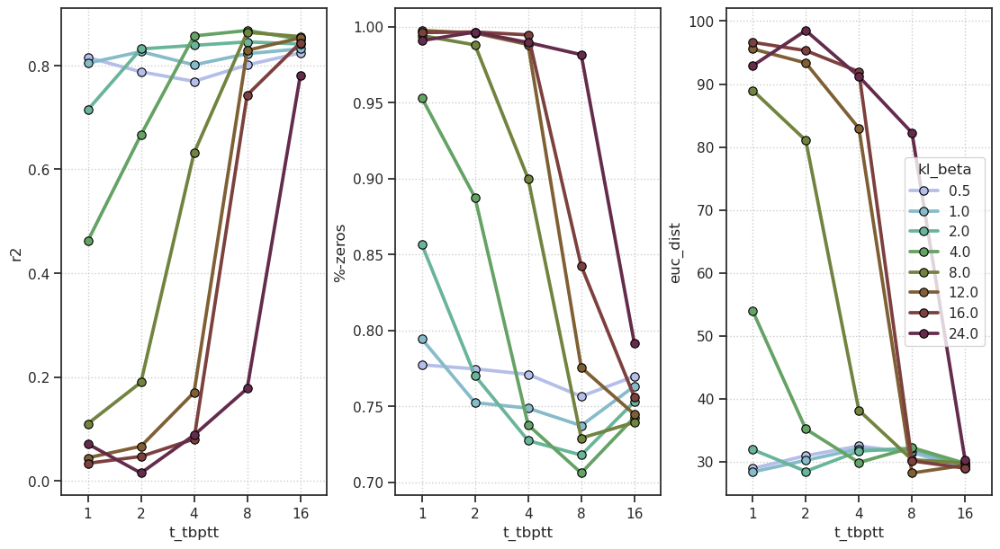

In [7]:
fig, axes = create_figure(1, 3, (11, 6))

sns.pointplot(
    data=df,
    x='t_tbptt',
    y='r2',
    hue='kl_beta',
    palette=cube,
    markeredgecolor='k',
    markeredgewidth=0.8,
    legend=False,
    ax=axes[0],
)
sns.pointplot(
    data=df,
    x='t_tbptt',
    y='%-zeros',
    hue='kl_beta',
    palette=cube,
    markeredgecolor='k',
    markeredgewidth=0.8,
    legend=False,
    ax=axes[1],
)
sns.pointplot(
    data=df,
    x='t_tbptt',
    y='euc_dist',
    hue='kl_beta',
    palette=cube,
    markeredgecolor='k',
    markeredgewidth=0.8,
    ax=axes[2],
)
add_grid(axes)
plt.show()

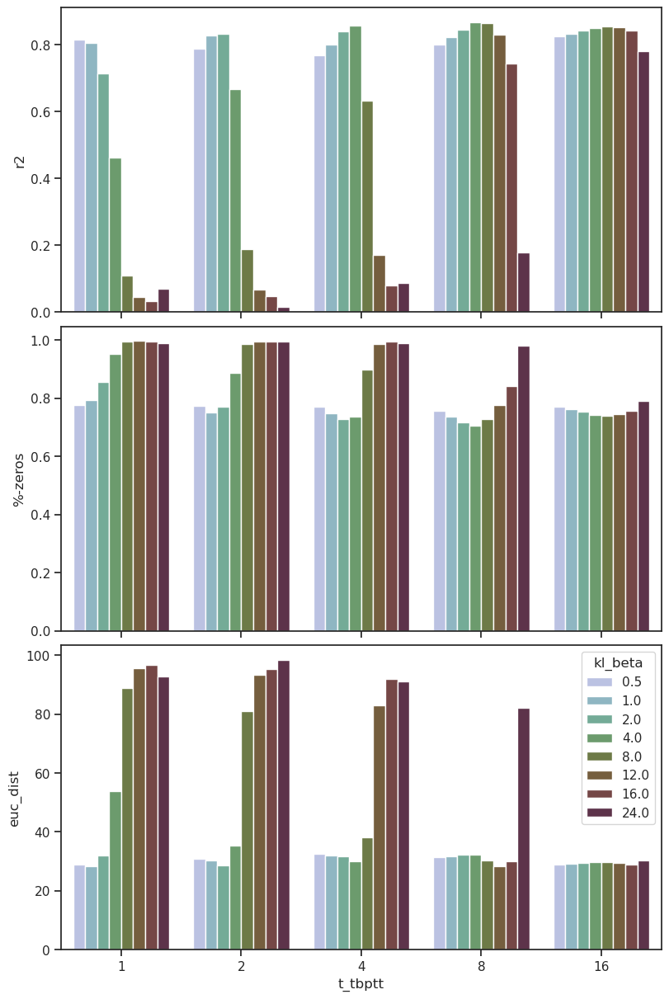

In [8]:
fig, axes = create_figure(3, 1, (8, 12), sharex='all')

sns.barplot(data=df, x='t_tbptt', y='r2', hue='kl_beta', palette=cube, legend=False, ax=axes[0])
sns.barplot(data=df, x='t_tbptt', y='%-zeros', hue='kl_beta', palette=cube, legend=False, ax=axes[1])
sns.barplot(data=df, x='t_tbptt', y='euc_dist', hue='kl_beta', palette=cube, ax=axes[2])

plt.show()

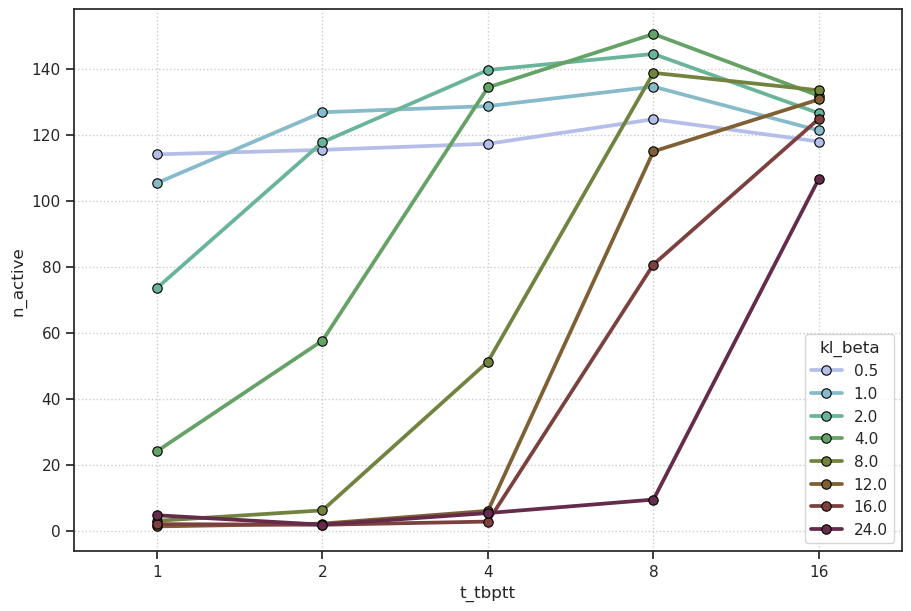

In [9]:
fig, ax = create_figure(1, 1, (9, 6))

sns.pointplot(
    data=df,
    x='t_tbptt',
    y='n_active',
    hue='kl_beta',
    palette=cube,
    markeredgecolor='k',
    markeredgewidth=0.8,
)
add_grid(ax)
plt.show()

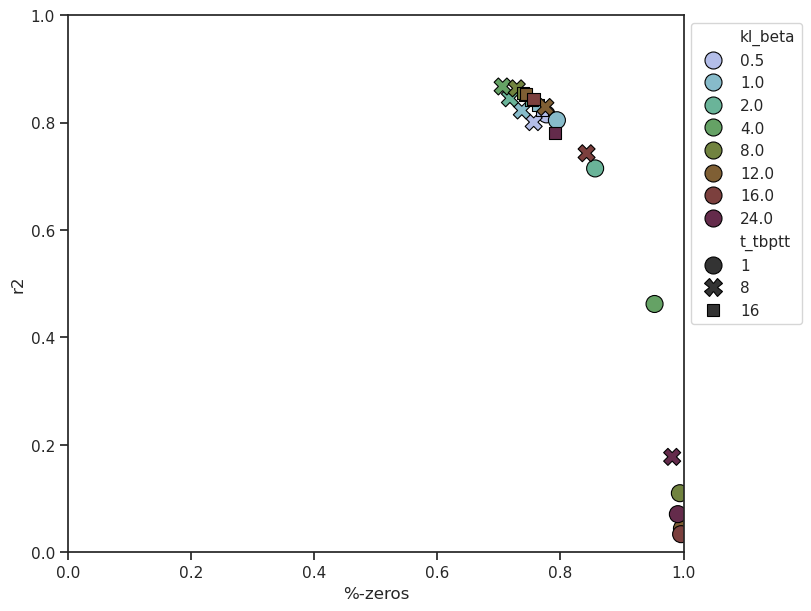

In [10]:
fig, ax = create_figure(1, 1, (8, 6))

_df = df.loc[df['t_tbptt'].isin([1, 8, 16])]

sns.scatterplot(
    data=_df,
    x='%-zeros',
    y='r2',
    style='t_tbptt',
    hue='kl_beta',
    palette=cube,
    edgecolor='black',
    linewidth=0.8,
    s=150,
    ax=ax,
)
ax.set(xlim=(0, 1), ylim=(0, 1))
move_legend(ax, (1, 1))
plt.show()

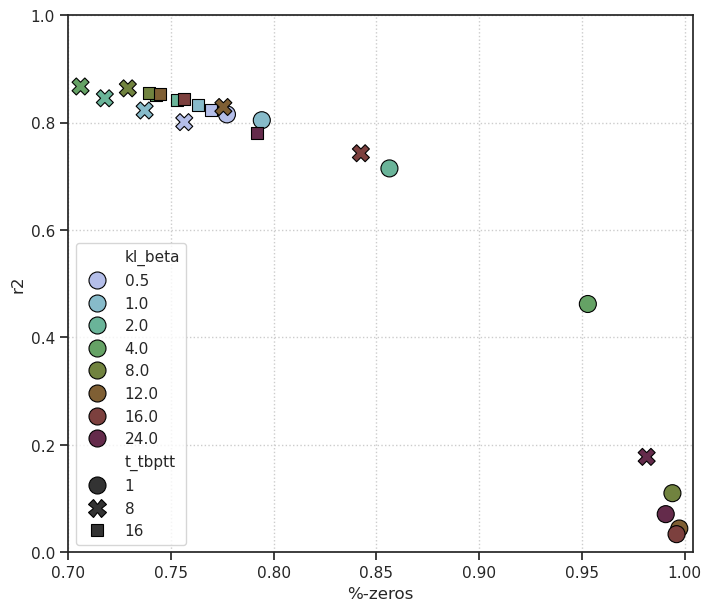

In [11]:
fig, ax = create_figure(1, 1, (7, 6))

_df = df.loc[df['t_tbptt'].isin([1, 8, 16])]

sns.scatterplot(
    data=_df,
    x='%-zeros',
    y='r2',
    style='t_tbptt',
    hue='kl_beta',
    palette=cube,
    edgecolor='black',
    linewidth=0.8,
    s=150,
    ax=ax,
)
ax.set(xlim=(0.7, 1.004), ylim=(0, 1))
sns.move_legend(ax, 'lower left')
add_grid(ax)
plt.show()

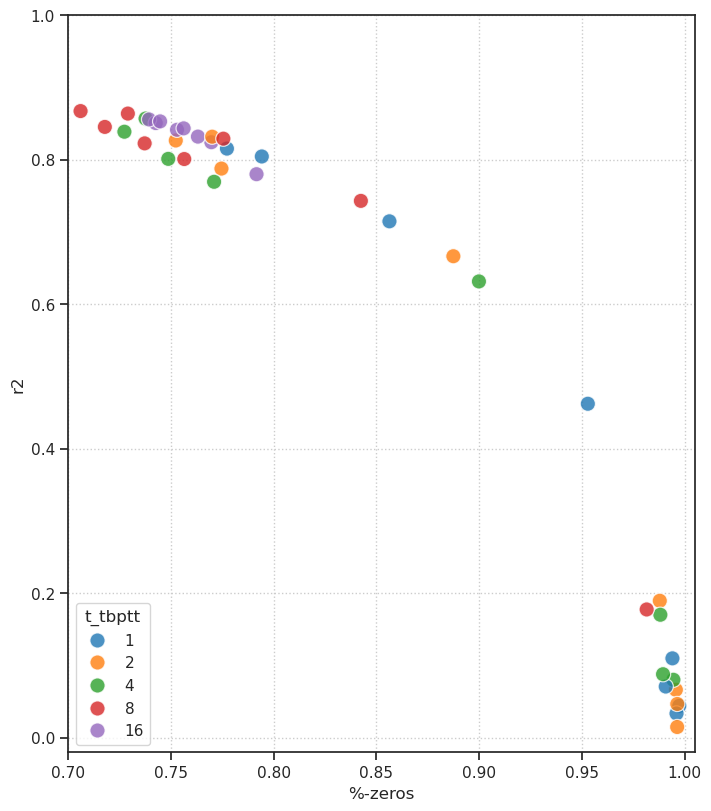

In [12]:
fig, ax = create_figure(1, 1, (7, 8))

sns.scatterplot(
    data=df,
    x='%-zeros',
    y='r2',
    hue='t_tbptt',
    palette='tab10',
    # edgecolor='black',
    # linewidth=0.8,
    alpha=0.8,
    s=120,
    ax=ax,
)
ax.set(xlim=(0.7, 1.005), ylim=(-0.02, 1))
sns.move_legend(ax, 'lower left')
add_grid(ax)
plt.show()

## Plot dicts

In [13]:
from analysis.final import get_root_path

root = get_root_path()

cond = lambda f: 'vH16-wht' in f and ('tbptt' in f or '2025_08_19' in f)

fits = sorted(os.listdir(root), key=alphanum_sort_key)
fits = [f for f in fits if cond(f)]

len(fits)

40

params:                 beta = 0.5,  tbptt = 1,
performance:            r2 = 0.82,  %-zeros = 0.78,  euc_dist = 28.9

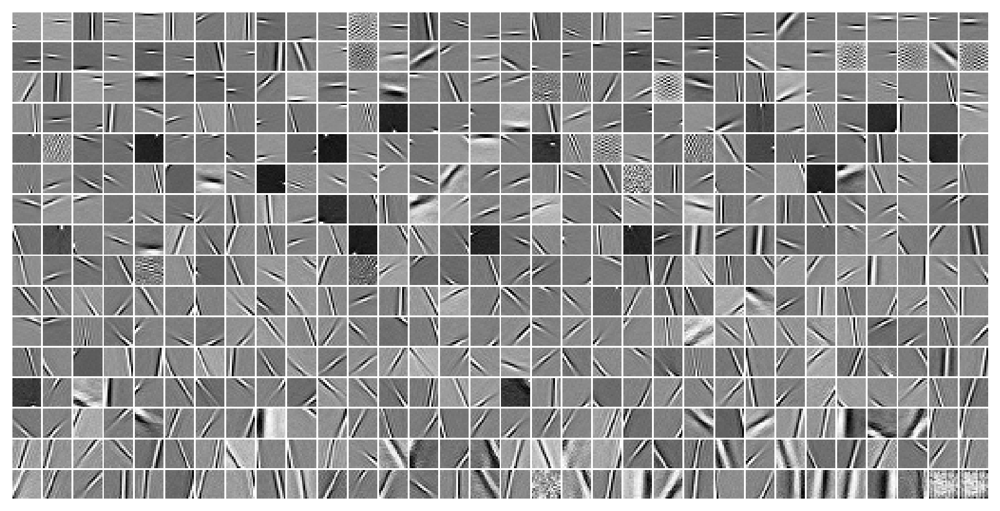

params:                 beta = 0.5,  tbptt = 2,
performance:            r2 = 0.79,  %-zeros = 0.77,  euc_dist = 31.0

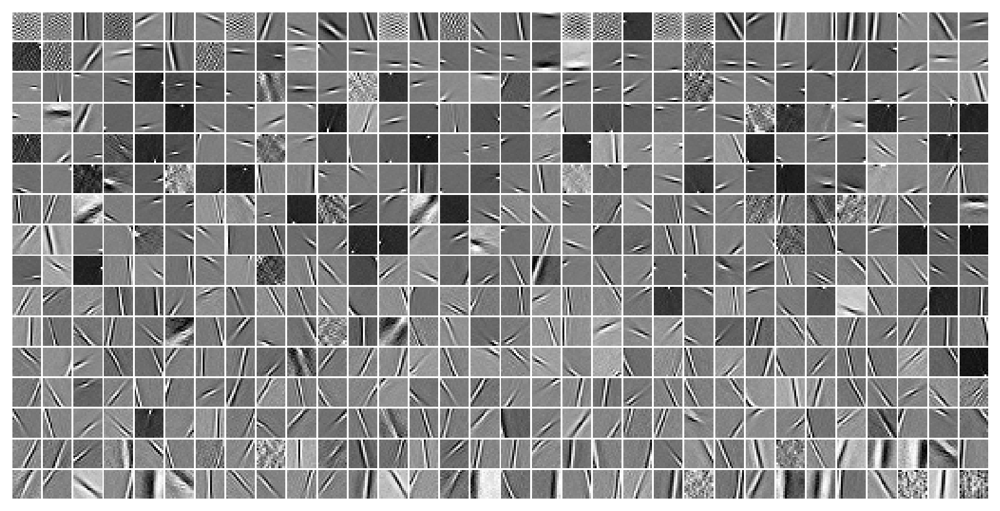

params:                 beta = 0.5,  tbptt = 4,
performance:            r2 = 0.77,  %-zeros = 0.77,  euc_dist = 32.5

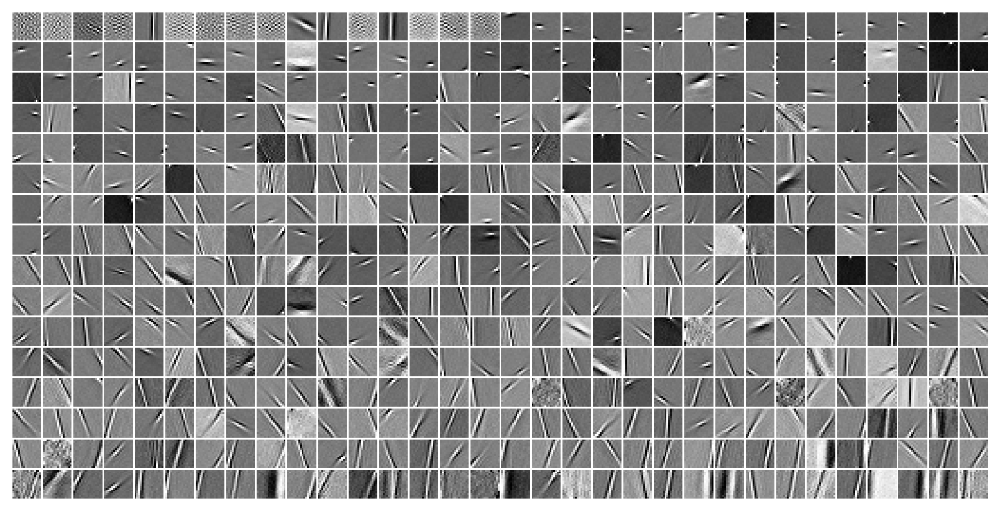

params:                 beta = 0.5,  tbptt = 8,
performance:            r2 = 0.80,  %-zeros = 0.76,  euc_dist = 31.4

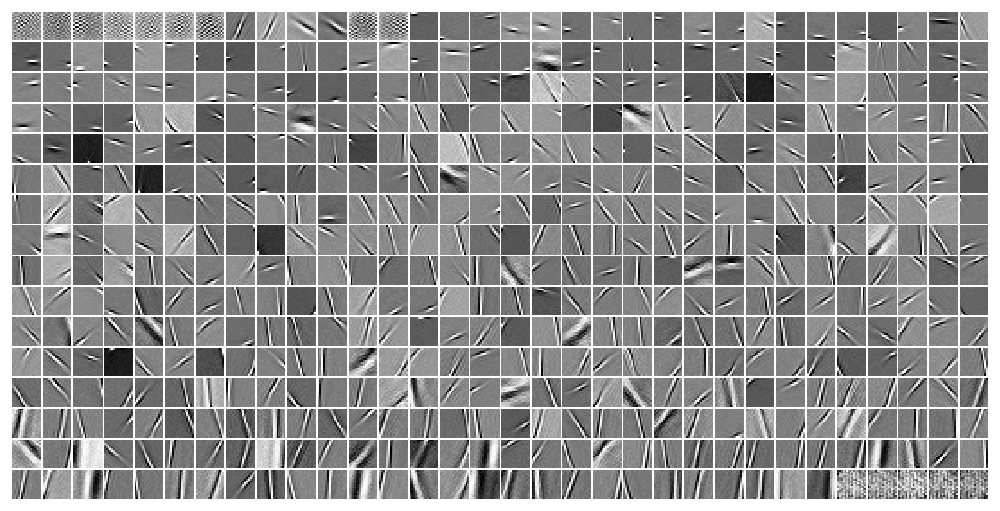

params:                 beta = 0.5,  tbptt = 16,
performance:            r2 = 0.82,  %-zeros = 0.77,  euc_dist = 29.0

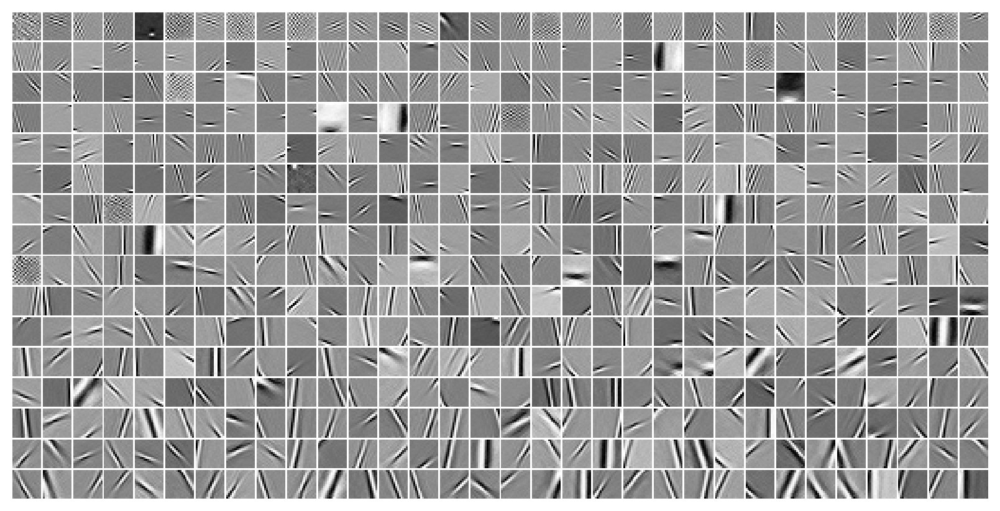

params:                 beta = 1.0,  tbptt = 1,
performance:            r2 = 0.80,  %-zeros = 0.79,  euc_dist = 28.4

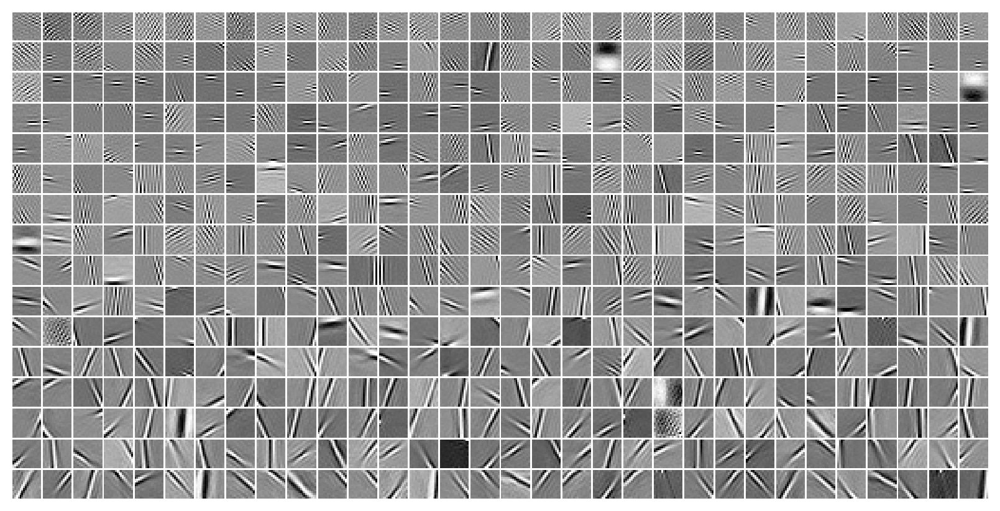

params:                 beta = 1.0,  tbptt = 2,
performance:            r2 = 0.83,  %-zeros = 0.75,  euc_dist = 30.2

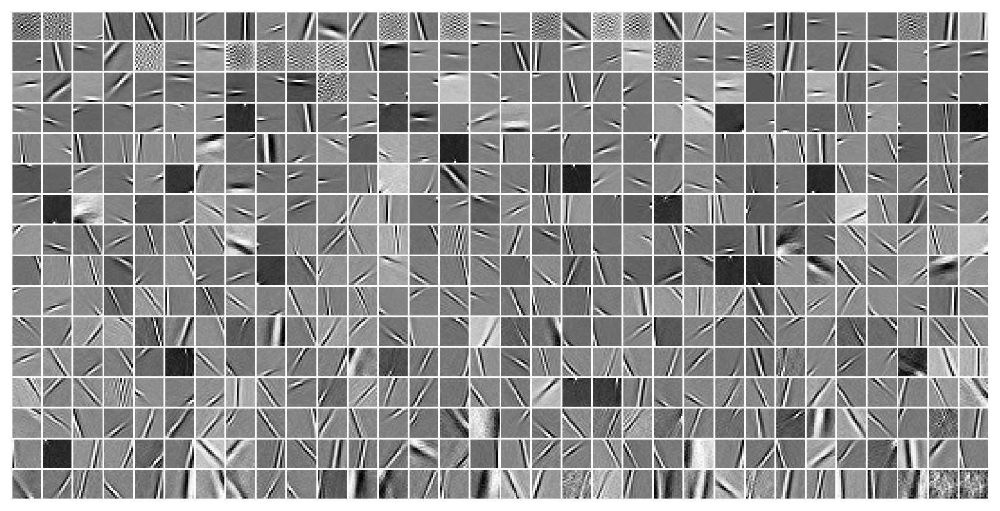

params:                 beta = 1.0,  tbptt = 4,
performance:            r2 = 0.80,  %-zeros = 0.75,  euc_dist = 32.0

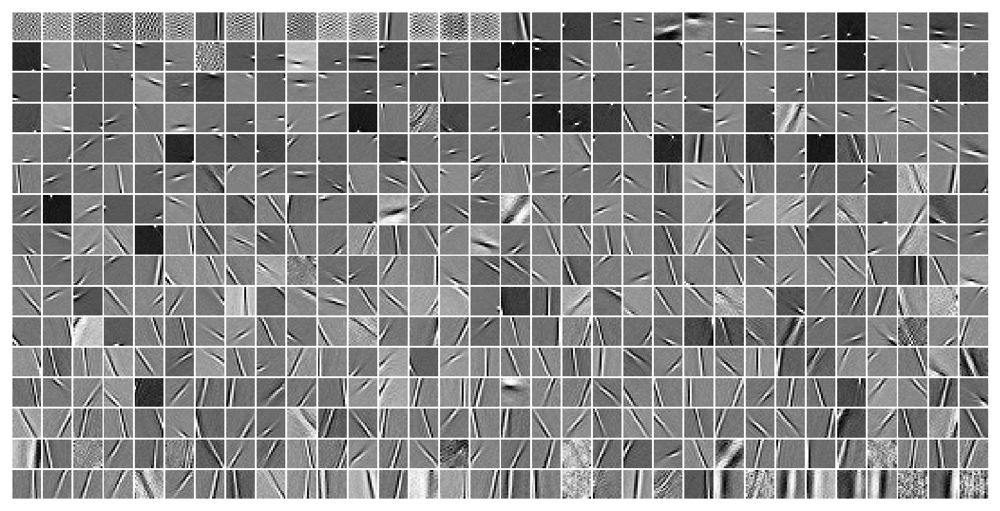

params:                 beta = 1.0,  tbptt = 8,
performance:            r2 = 0.82,  %-zeros = 0.74,  euc_dist = 31.7

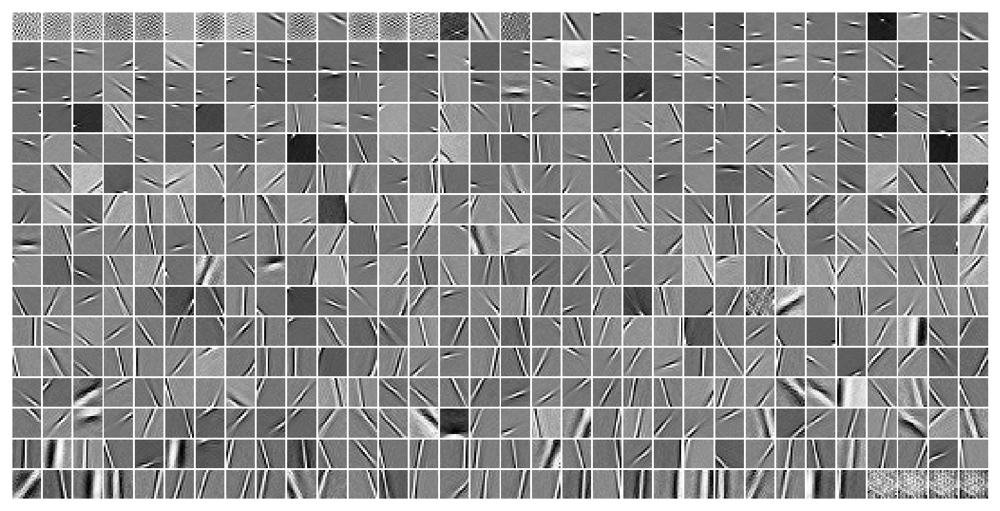

params:                 beta = 1.0,  tbptt = 16,
performance:            r2 = 0.83,  %-zeros = 0.76,  euc_dist = 29.0

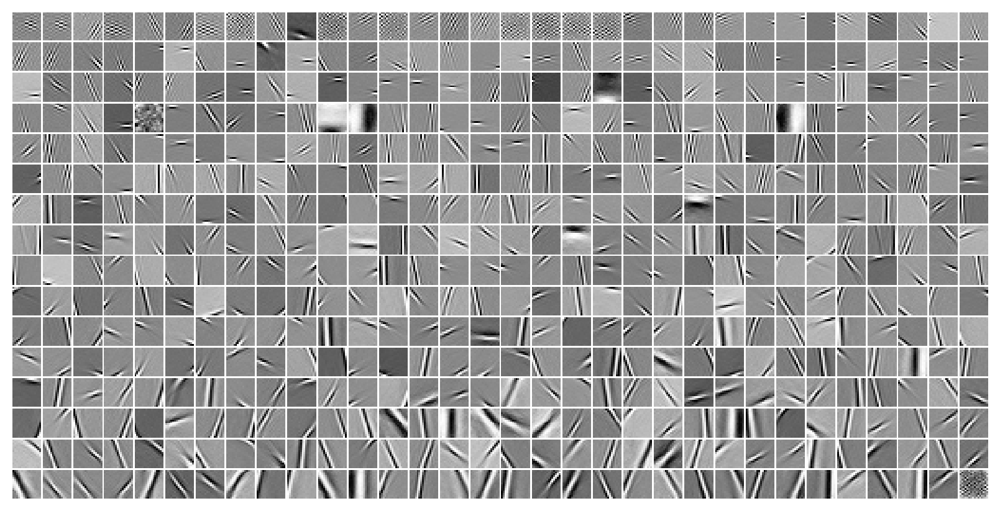

params:                 beta = 2.0,  tbptt = 1,
performance:            r2 = 0.71,  %-zeros = 0.86,  euc_dist = 31.9

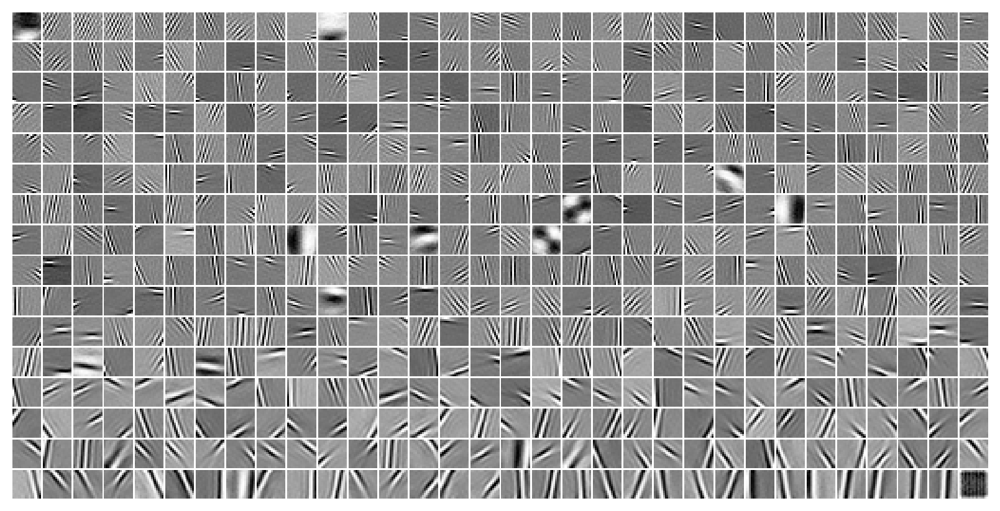

params:                 beta = 2.0,  tbptt = 2,
performance:            r2 = 0.83,  %-zeros = 0.77,  euc_dist = 28.5

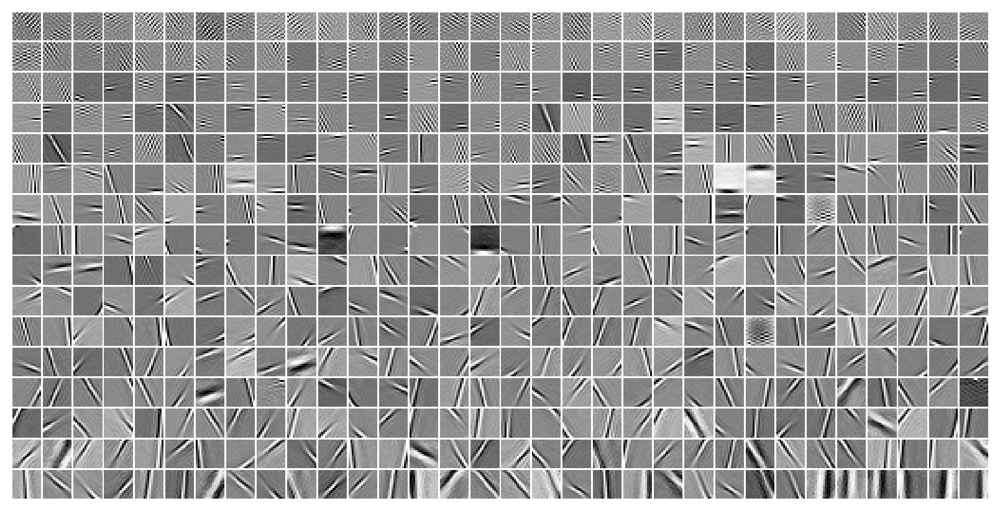

params:                 beta = 2.0,  tbptt = 4,
performance:            r2 = 0.84,  %-zeros = 0.73,  euc_dist = 31.7

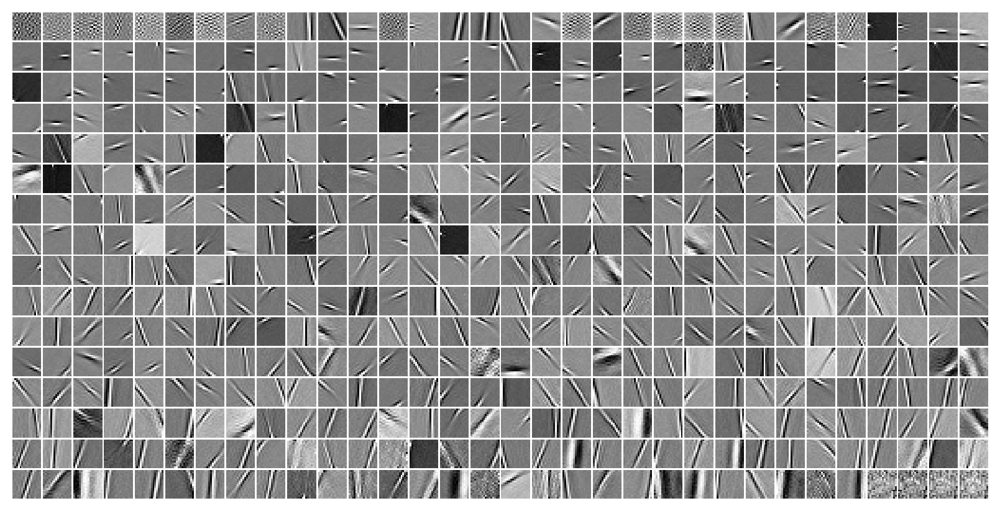

params:                 beta = 2.0,  tbptt = 8,
performance:            r2 = 0.85,  %-zeros = 0.72,  euc_dist = 32.2

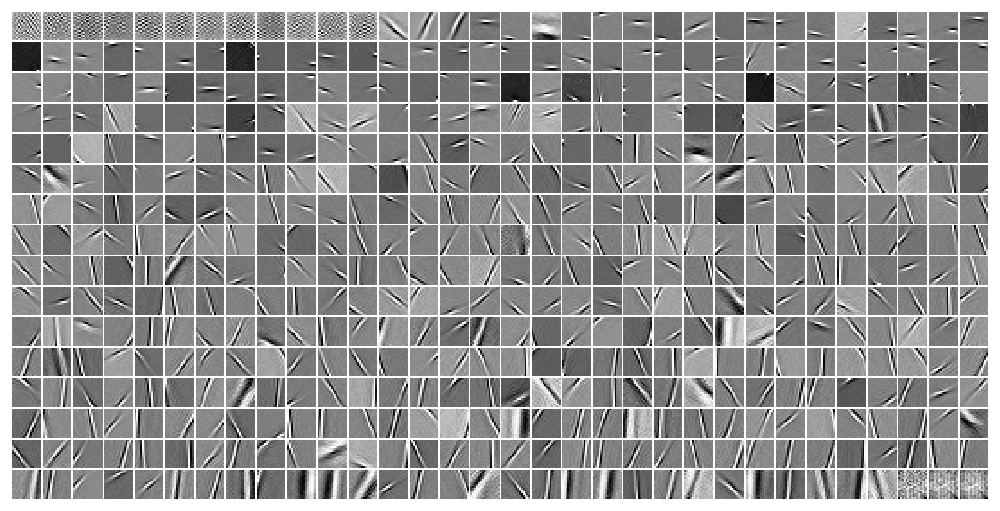

params:                 beta = 2.0,  tbptt = 16,
performance:            r2 = 0.84,  %-zeros = 0.75,  euc_dist = 29.3

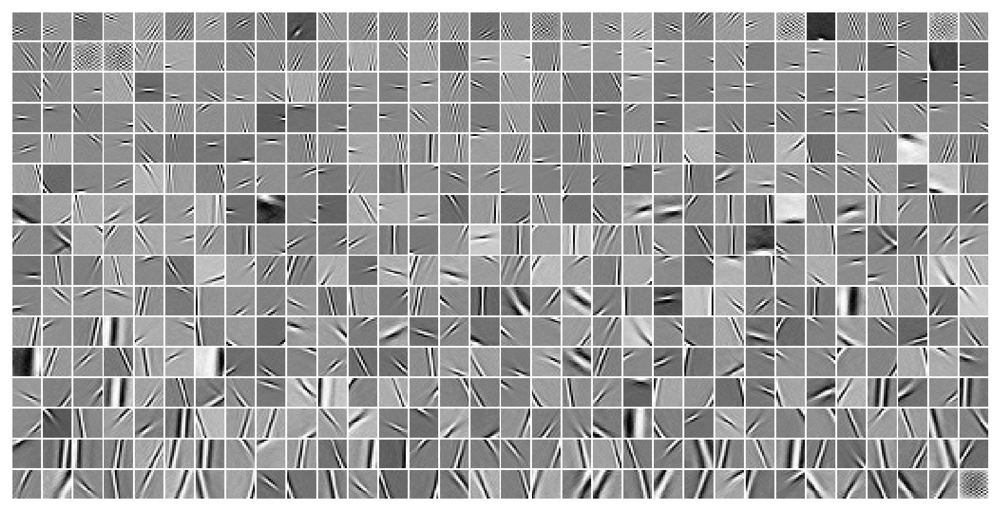

params:                 beta = 4.0,  tbptt = 1,
performance:            r2 = 0.46,  %-zeros = 0.95,  euc_dist = 54.0

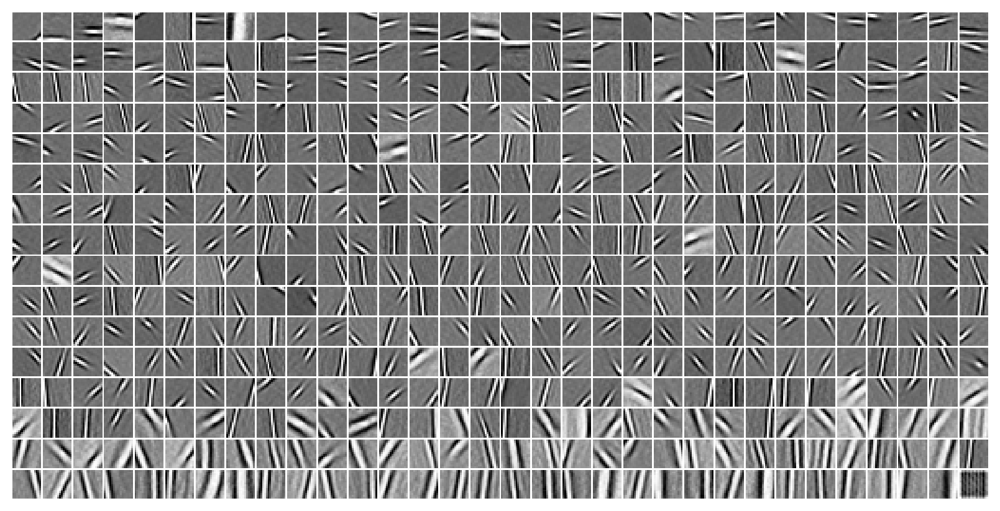

params:                 beta = 4.0,  tbptt = 2,
performance:            r2 = 0.67,  %-zeros = 0.89,  euc_dist = 35.2

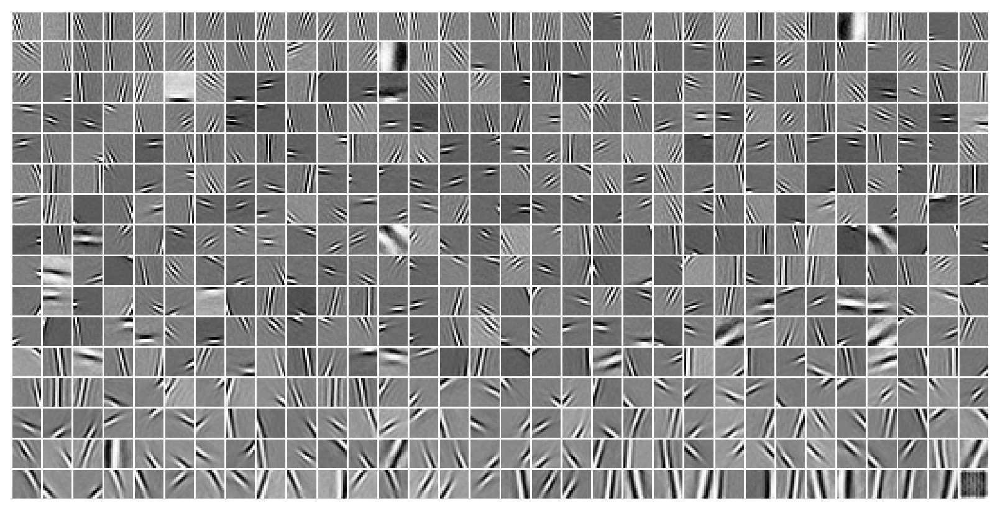

params:                 beta = 4.0,  tbptt = 4,
performance:            r2 = 0.86,  %-zeros = 0.74,  euc_dist = 29.9

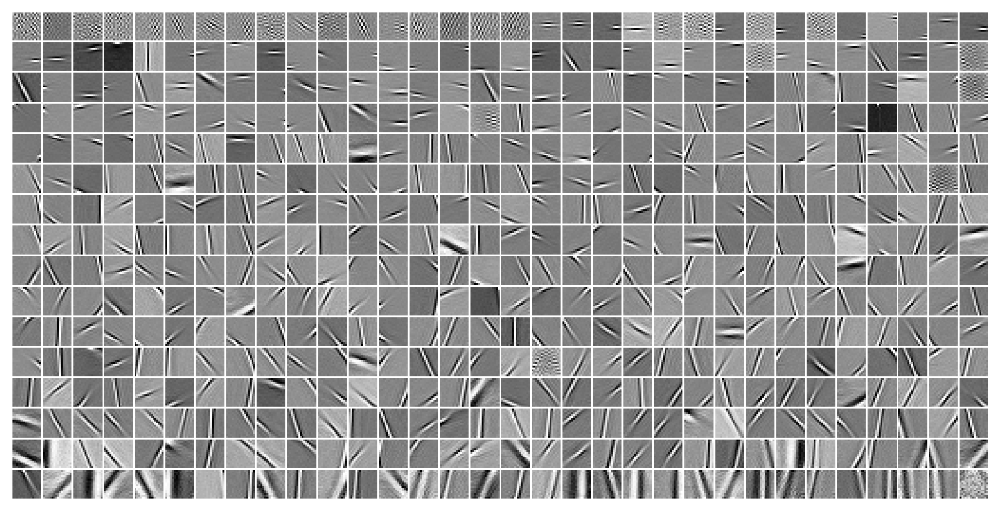

params:                 beta = 4.0,  tbptt = 8,
performance:            r2 = 0.87,  %-zeros = 0.71,  euc_dist = 32.2

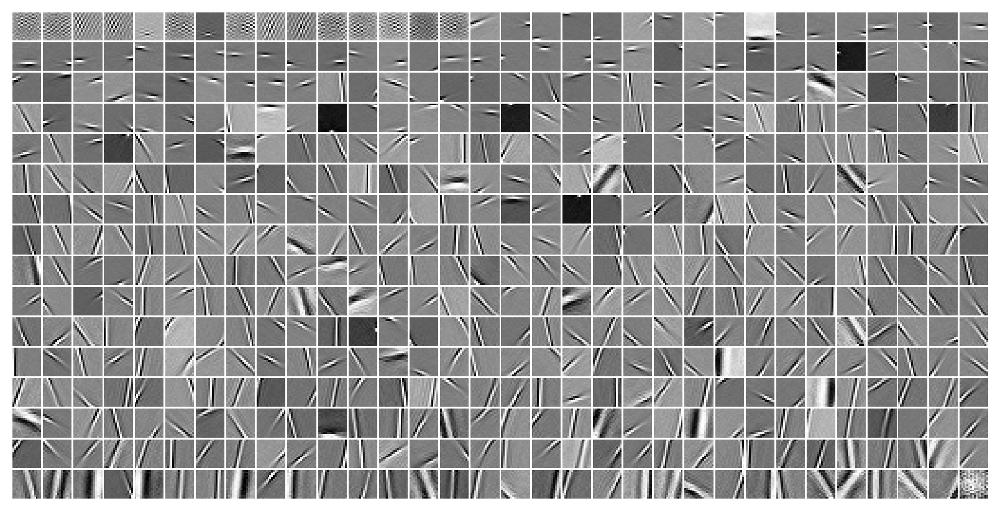

params:                 beta = 4.0,  tbptt = 16,
performance:            r2 = 0.85,  %-zeros = 0.74,  euc_dist = 29.7

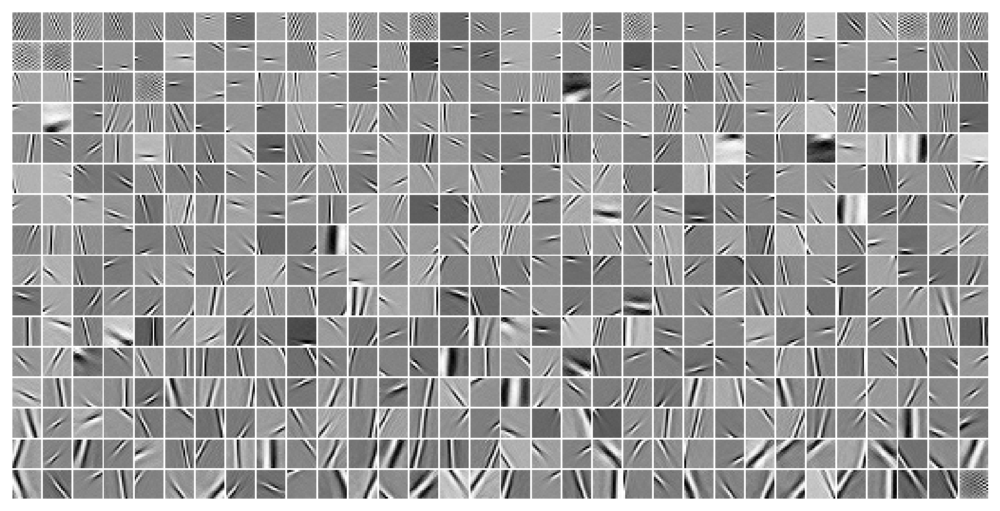

params:                 beta = 8.0,  tbptt = 1,
performance:            r2 = 0.11,  %-zeros = 0.99,  euc_dist = 89.0

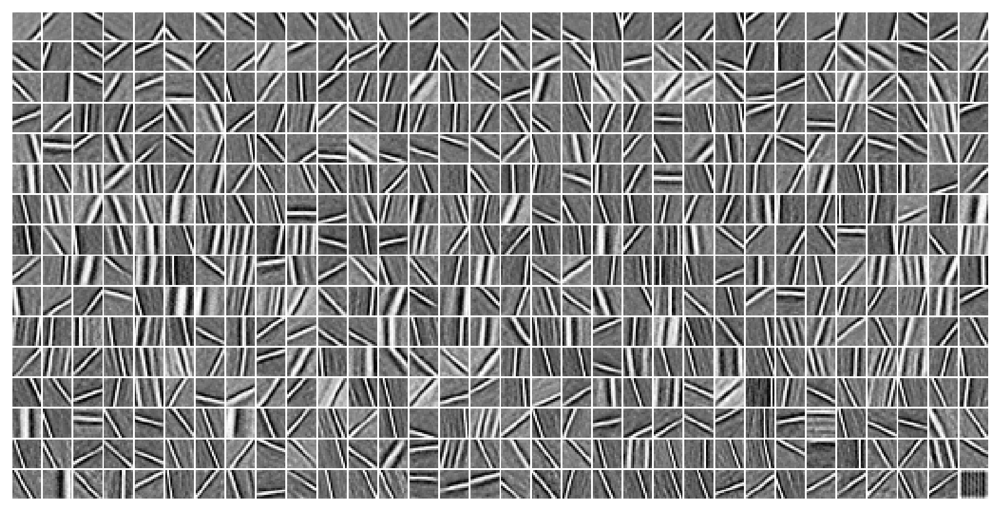

params:                 beta = 8.0,  tbptt = 2,
performance:            r2 = 0.19,  %-zeros = 0.99,  euc_dist = 81.0

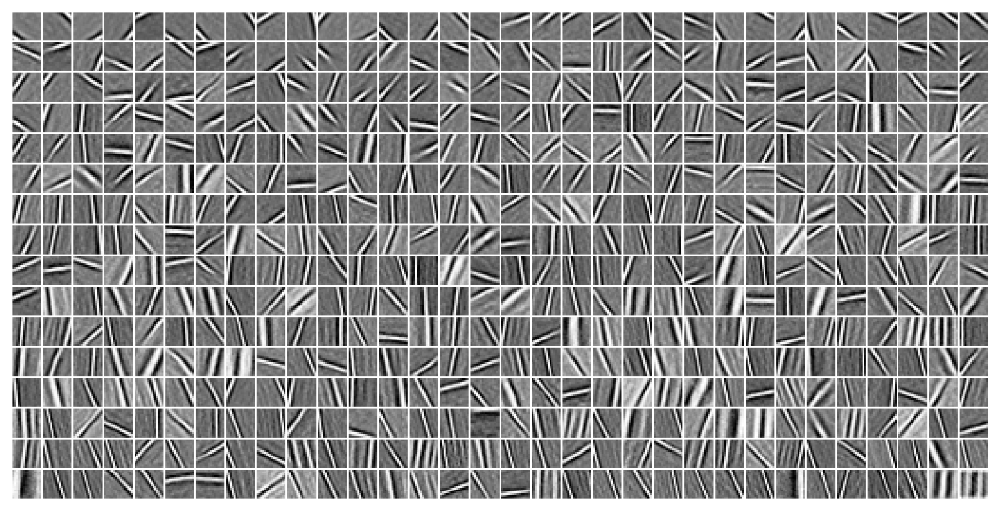

params:                 beta = 8.0,  tbptt = 4,
performance:            r2 = 0.63,  %-zeros = 0.90,  euc_dist = 38.2

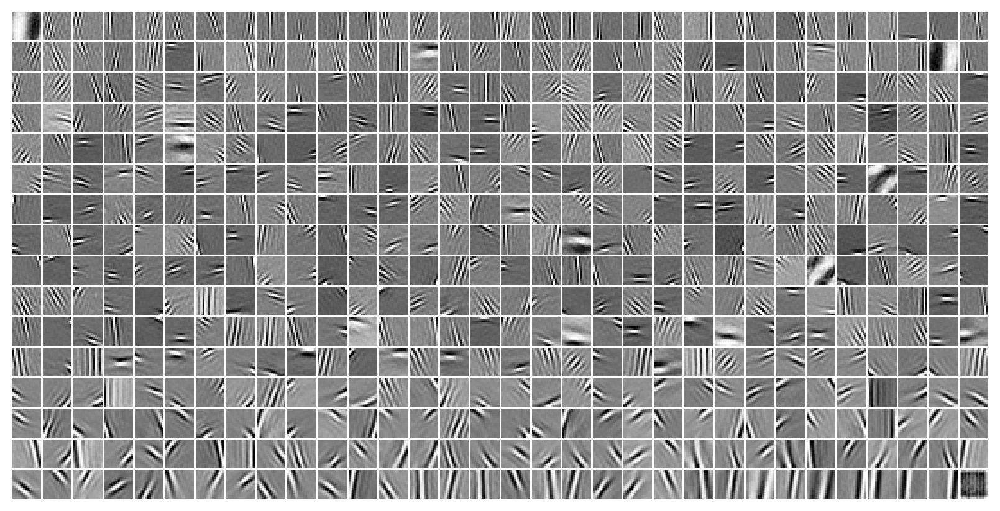

params:                 beta = 8.0,  tbptt = 8,
performance:            r2 = 0.86,  %-zeros = 0.73,  euc_dist = 30.3

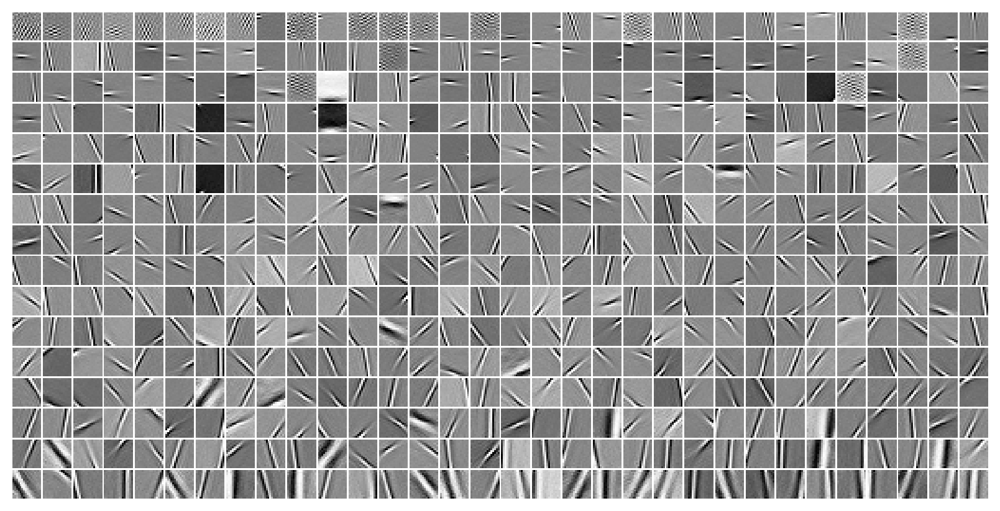

params:                 beta = 8.0,  tbptt = 16,
performance:            r2 = 0.86,  %-zeros = 0.74,  euc_dist = 29.8

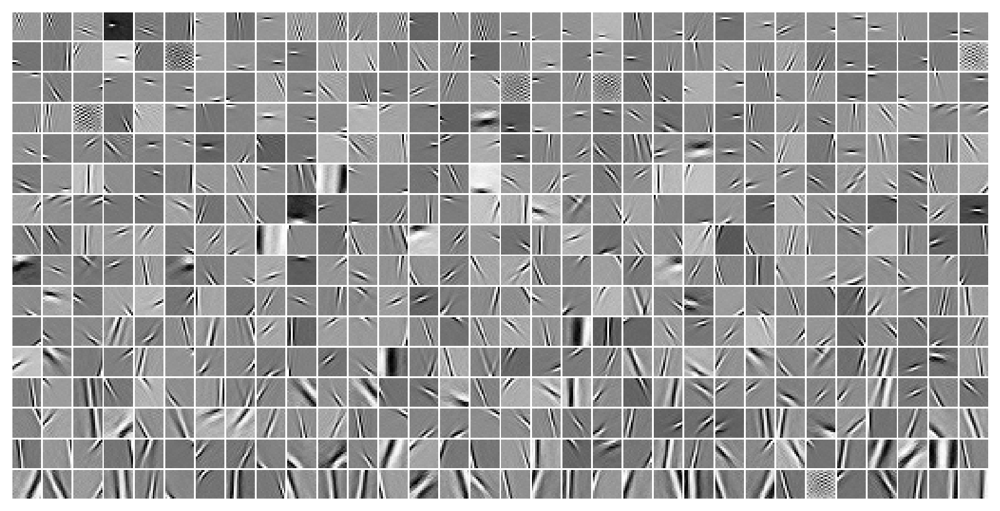

params:                 beta = 12.0,  tbptt = 1,
performance:            r2 = 0.04,  %-zeros = 1.00,  euc_dist = 95.6

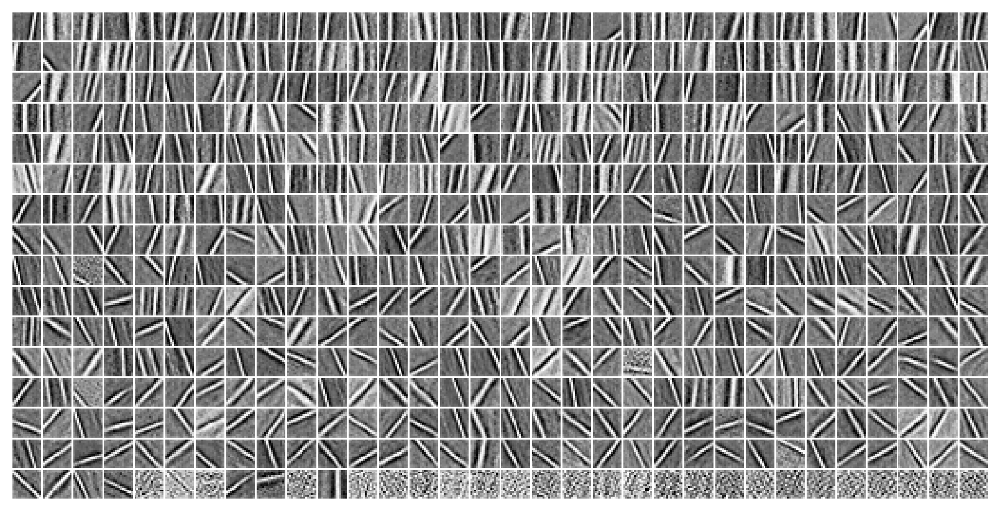

params:                 beta = 12.0,  tbptt = 2,
performance:            r2 = 0.07,  %-zeros = 1.00,  euc_dist = 93.4

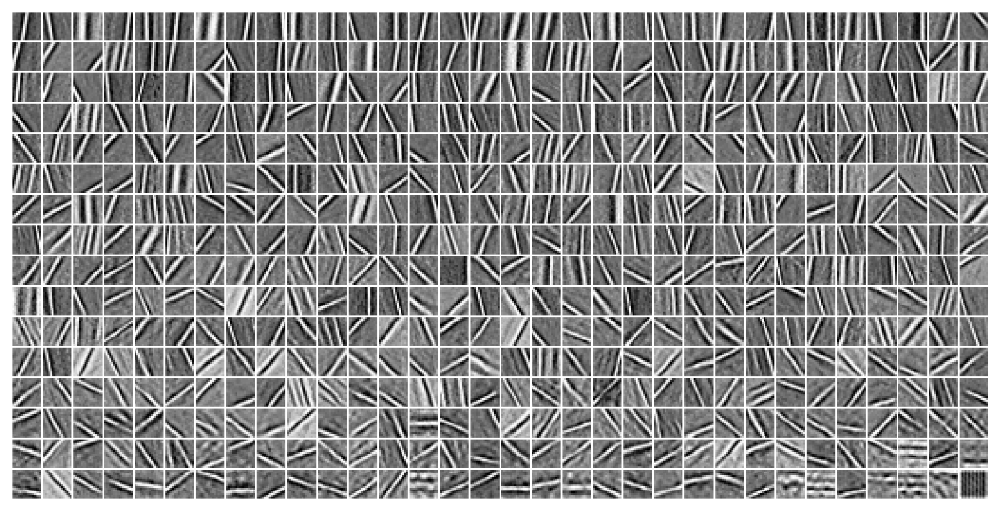

params:                 beta = 12.0,  tbptt = 4,
performance:            r2 = 0.17,  %-zeros = 0.99,  euc_dist = 83.0

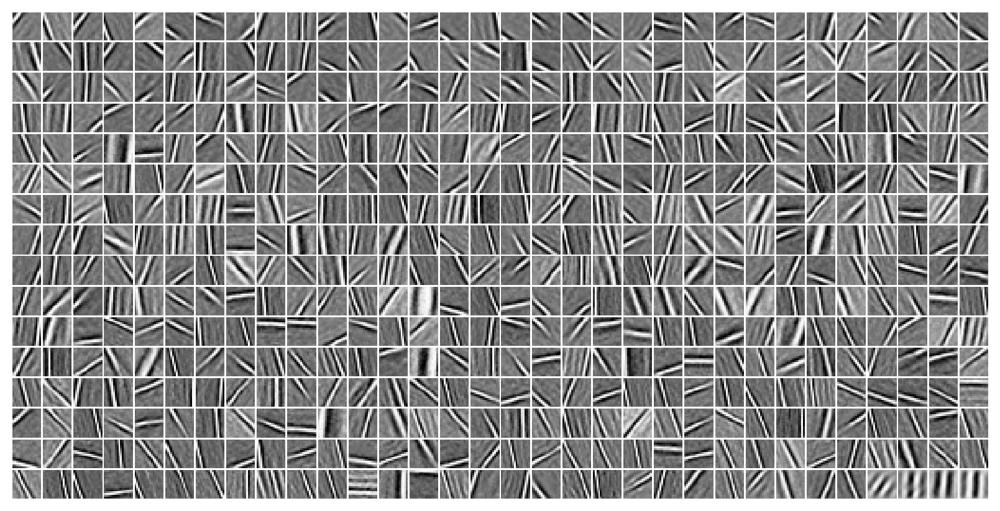

params:                 beta = 12.0,  tbptt = 8,
performance:            r2 = 0.83,  %-zeros = 0.78,  euc_dist = 28.2

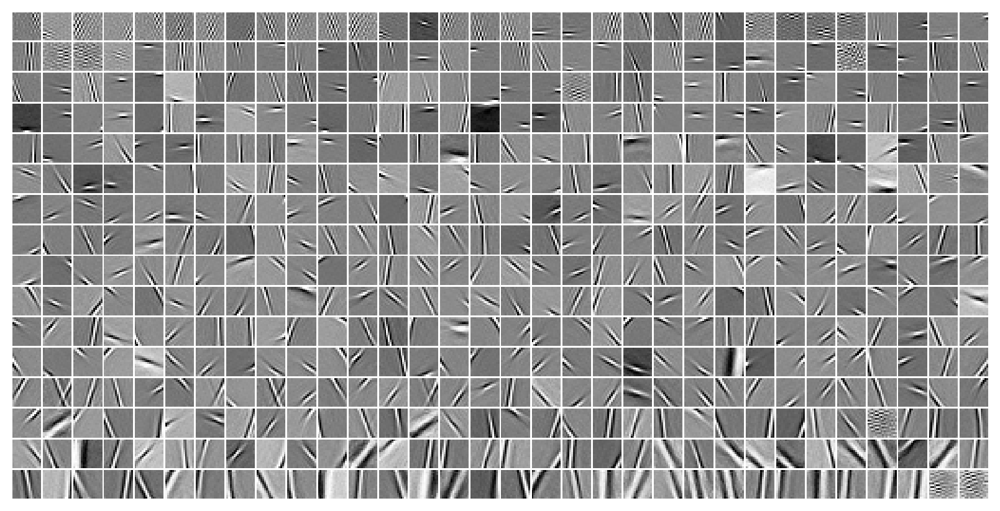

params:                 beta = 12.0,  tbptt = 16,
performance:            r2 = 0.85,  %-zeros = 0.74,  euc_dist = 29.4

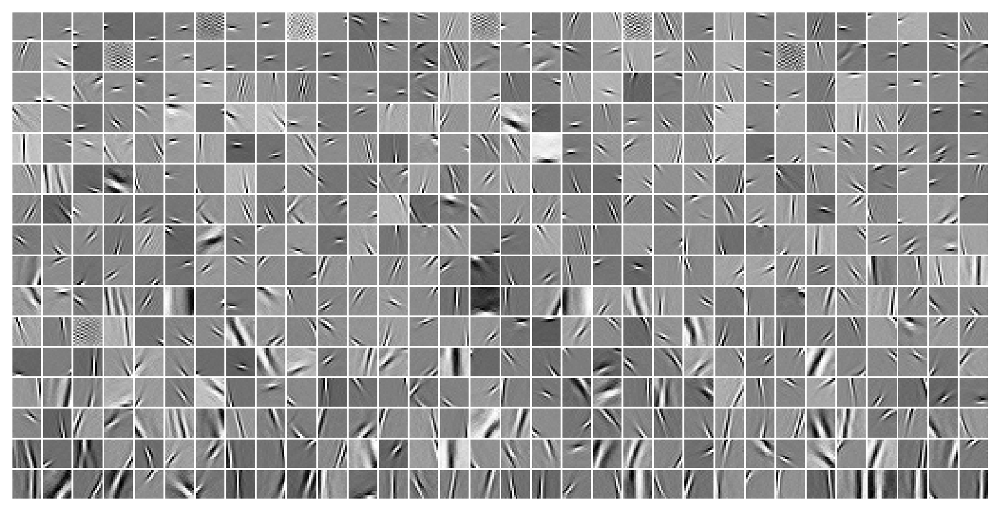

params:                 beta = 16.0,  tbptt = 1,
performance:            r2 = 0.03,  %-zeros = 1.00,  euc_dist = 96.6

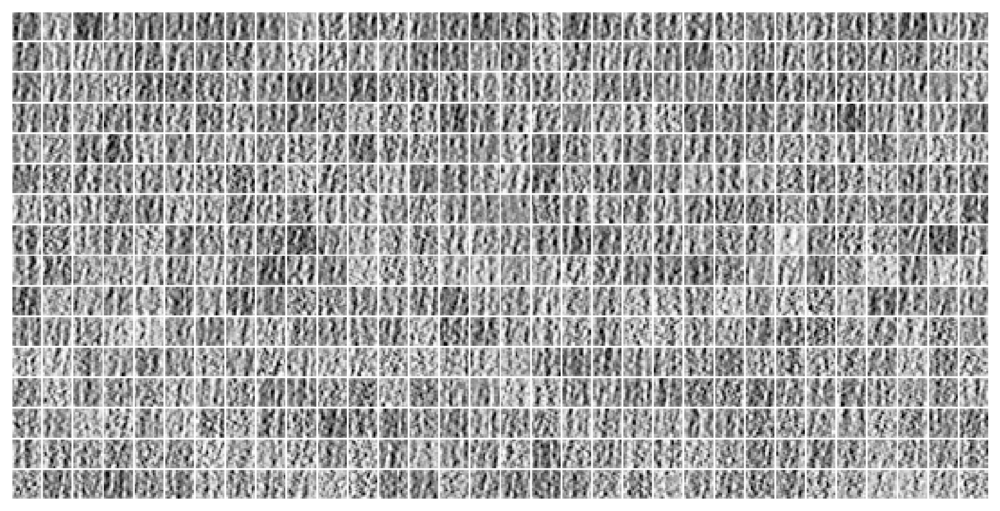

params:                 beta = 16.0,  tbptt = 2,
performance:            r2 = 0.05,  %-zeros = 1.00,  euc_dist = 95.3

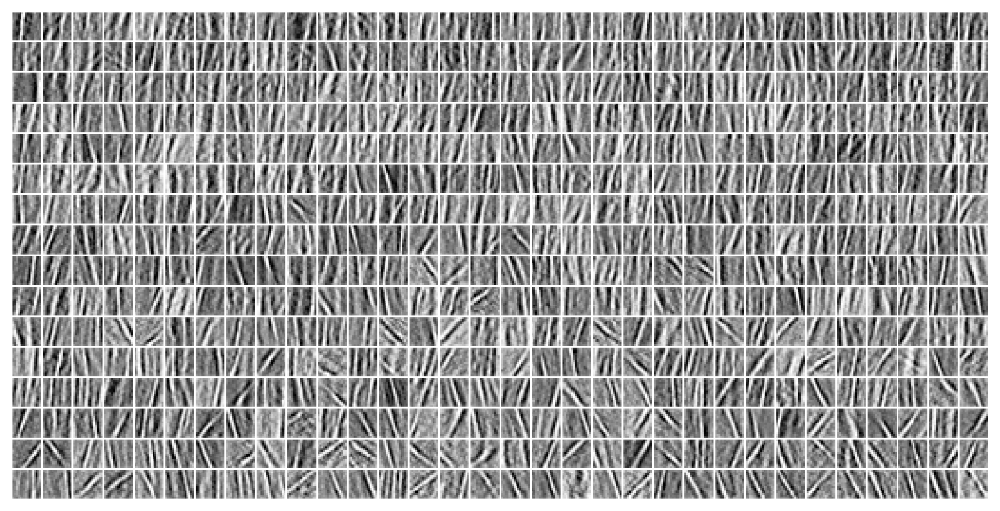

params:                 beta = 16.0,  tbptt = 4,
performance:            r2 = 0.08,  %-zeros = 0.99,  euc_dist = 92.0

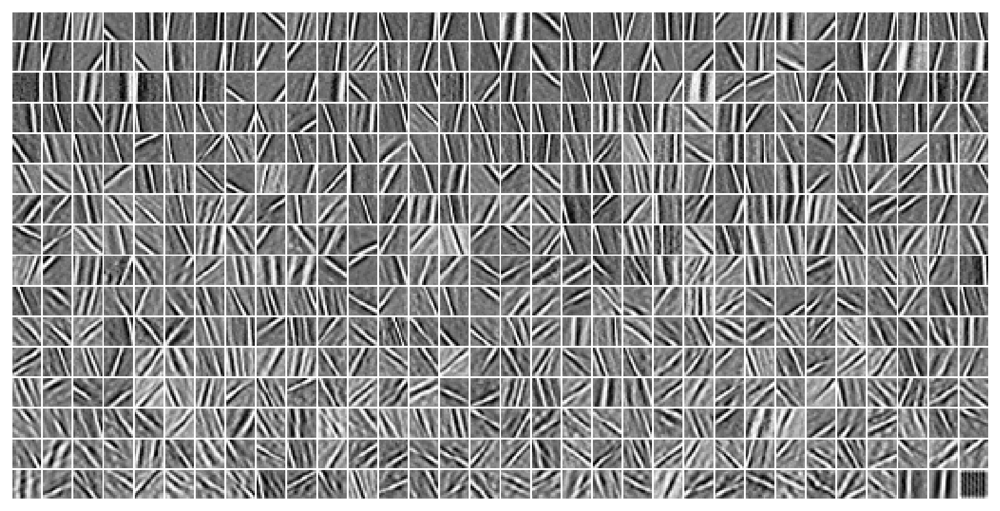

params:                 beta = 16.0,  tbptt = 8,
performance:            r2 = 0.74,  %-zeros = 0.84,  euc_dist = 30.1

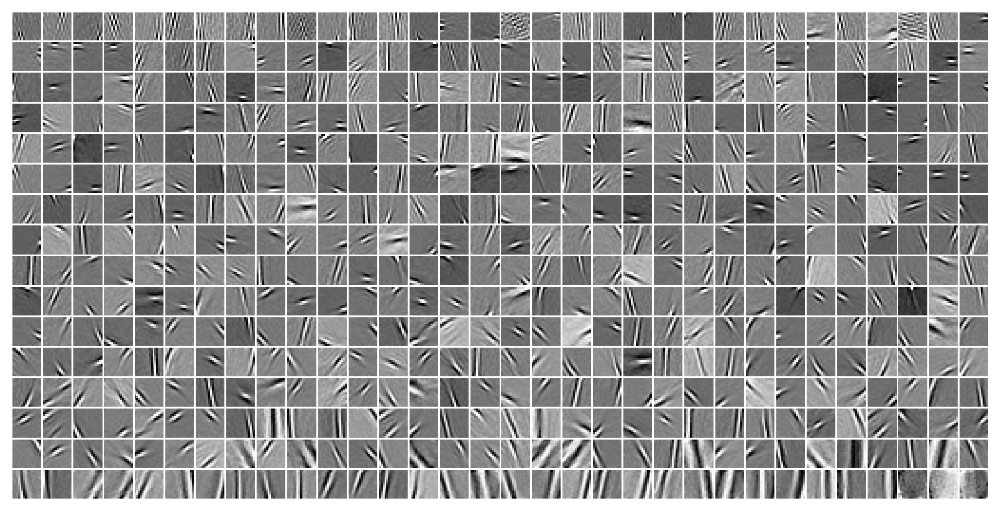

params:                 beta = 16.0,  tbptt = 16,
performance:            r2 = 0.84,  %-zeros = 0.76,  euc_dist = 29.0

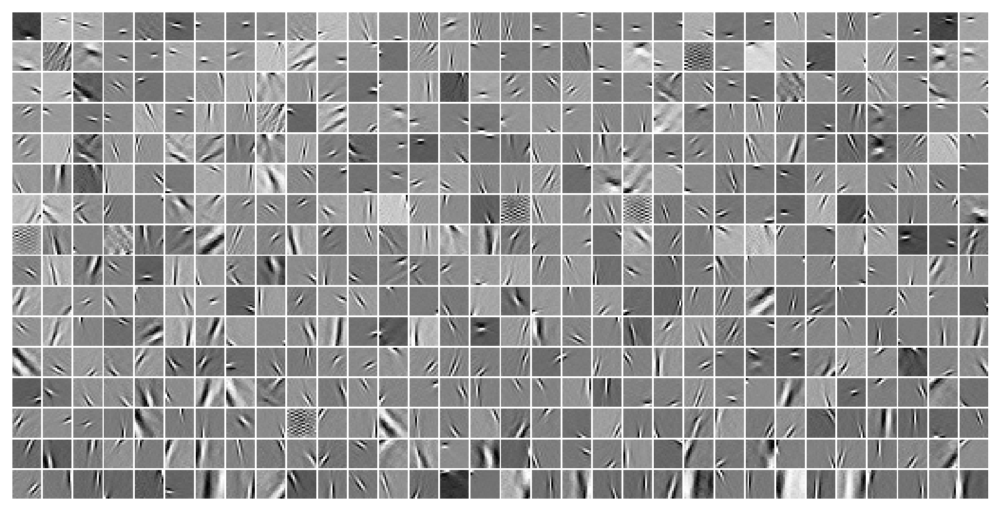

params:                 beta = 24.0,  tbptt = 1,
performance:            r2 = 0.07,  %-zeros = 0.99,  euc_dist = 92.9

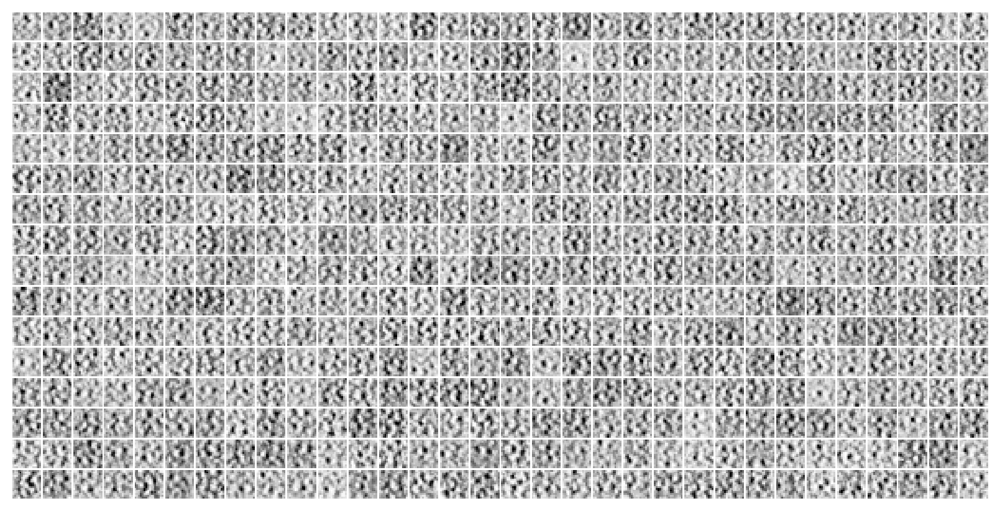

params:                 beta = 24.0,  tbptt = 2,
performance:            r2 = 0.01,  %-zeros = 1.00,  euc_dist = 98.5

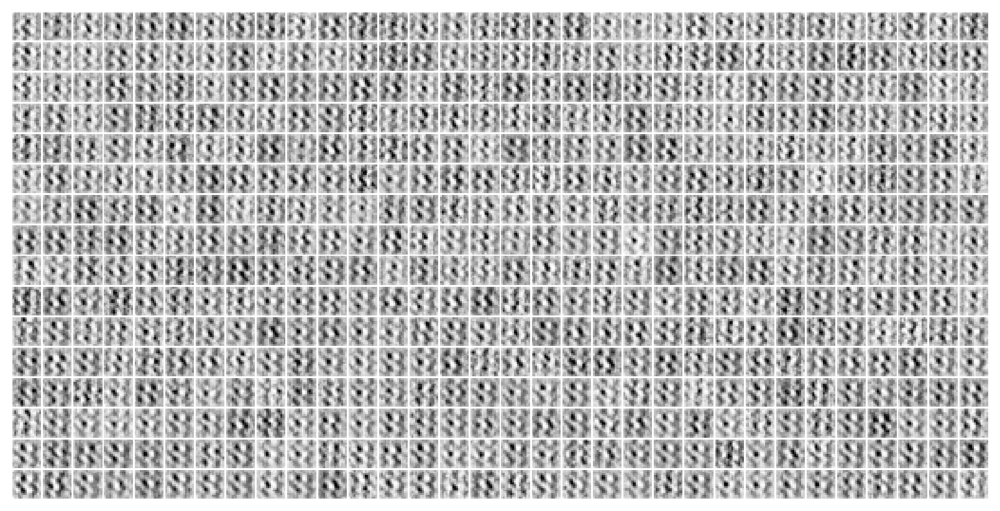

params:                 beta = 24.0,  tbptt = 4,
performance:            r2 = 0.09,  %-zeros = 0.99,  euc_dist = 91.2

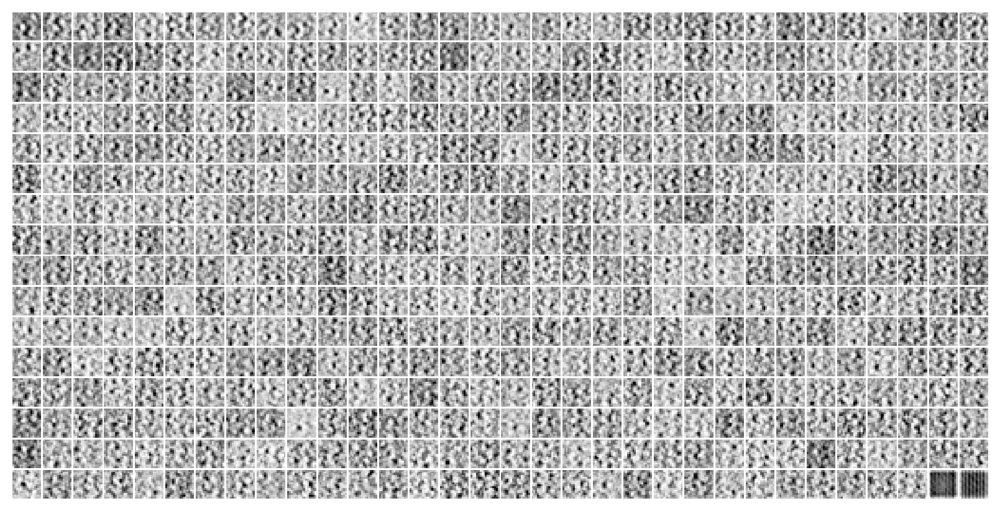

params:                 beta = 24.0,  tbptt = 8,
performance:            r2 = 0.18,  %-zeros = 0.98,  euc_dist = 82.3

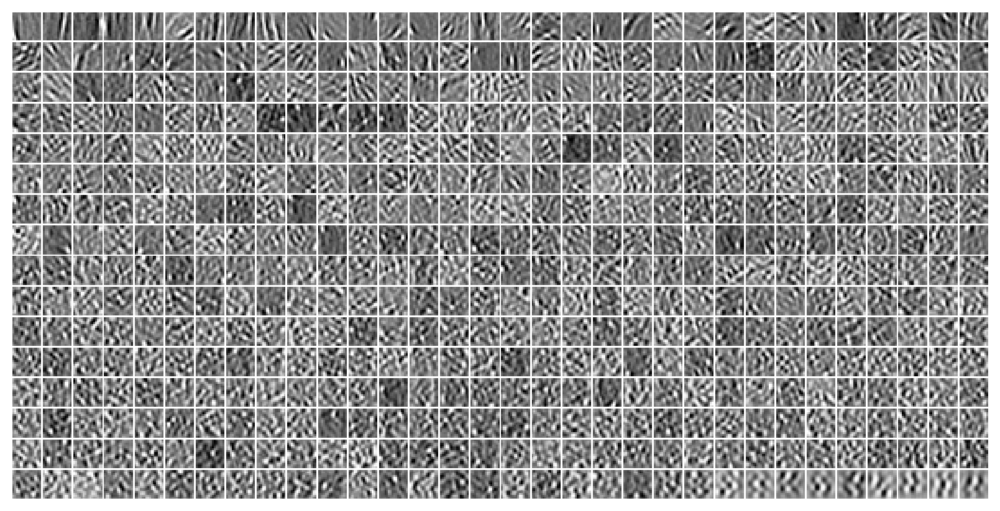

params:                 beta = 24.0,  tbptt = 16,
performance:            r2 = 0.78,  %-zeros = 0.79,  euc_dist = 30.3

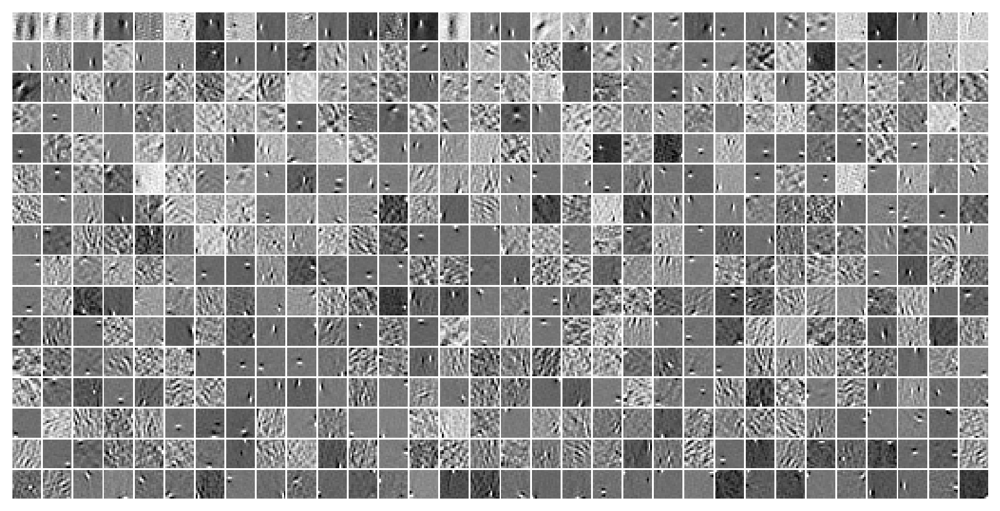

In [14]:
for name in fits:
    tr, meta = load_model_lite(
        pjoin(root, name),
        device=device,
        shuffle=False,
        verbose=False,
        strict=True,
    )
    u0 = tonp(tr.model.layer.u_init[0].squeeze())

    try:  # temporary solution
        tbptt = int_from_str(next(
            e for e in name.split('_')
            if 'tbptt' in e
        ))
    except StopIteration:
        tbptt = 1
    
    _df = df.loc[(df['t_tbptt'] == tbptt) & (df['kl_beta'] == tr.model.cfg.kl_beta)]
    str_performance = ',  '.join([
        f"r2 = {_df['r2'].item():0.2f}",
        f"%-zeros = {_df['%-zeros'].item():0.2f}",
        f"euc_dist = {_df['euc_dist'].item():0.1f}",
    ])
    str_params = f"params:\t\t\tbeta = {tr.model.cfg.kl_beta},  tbptt = {tbptt},"

    print(f"{str_params}\nperformance:\t\t{str_performance}")
    _ = tr.model.show(order=np.argsort(u0))
    print('\n')